In [6]:
# !pip install --force-reinstall --no-deps albumentations

  Using cached https://files.pythonhosted.org/packages/03/58/63fb1d742dc42d9ba2800ea741de1f2bc6bb05548d8724aa84794042eaf2/albumentations-0.5.2-py3-none-any.whl
  Found existing installation: albumentations 0.5.2
    Uninstalling albumentations-0.5.2:
      Successfully uninstalled albumentations-0.5.2


In [3]:
# cd drive/MyDrive/Colab\ Notebooks/COCO

이 폴더를 다음과 같이 데이터 위치에 넣고 돌려주세요~
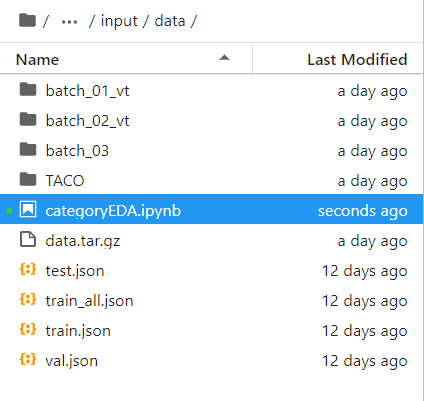

In [4]:
import os
import random
import time
import json
import warnings 
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
# from utils import label_accuracy_score
import cv2

import numpy as np
import pandas as pd

# 전처리를 위한 라이브러리
from pycocotools.coco import COCO
import torchvision
import torchvision.transforms as transforms

import albumentations as A
from albumentations.pytorch import ToTensorV2


# 시각화를 위한 라이브러리
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

plt.rcParams['axes.grid'] = False

print('pytorch version: {}'.format(torch.__version__))
print('GPU 사용 가능 여부: {}'.format(torch.cuda.is_available()))

print(torch.cuda.get_device_name(0))
print(torch.cuda.device_count())

device = "cuda" if torch.cuda.is_available() else "cpu"   # GPU 사용 가능 여부에 따라 device 정보 저장

pytorch version: 1.4.0
GPU 사용 가능 여부: True
Tesla P40
1


In [10]:
%matplotlib inline

dataset_path = './'
trian_file_path = dataset_path + 'train.json'
test_file_path = dataset_path + 'test.json'
train_all_file_path = dataset_path + 'train_all.json'
val_file_path = dataset_path + 'val.json'

# Read annotations
with open(trian_file_path, 'r') as f:
    train_dataset = json.loads(f.read())

with open(val_file_path, 'r') as f:
    val_dataset = json.loads(f.read())

with open(train_all_file_path, 'r') as f:
    train_all_dataset = json.loads(f.read())

with open(test_file_path, 'r') as f:
    test_dataset = json.loads(f.read())

In [11]:
train_categories = train_dataset['categories']
train_anns = train_dataset['annotations']
train_imgs = train_dataset['images']
nr_cats = len(train_categories)
nr_annotations = len(train_anns)
nr_images = len(train_imgs)

print(f"train 데이터는 {nr_cats}개의 카테고리, {nr_annotations}개의 annotation, {nr_images}개의 이미지를 가지고 있습니다.")

train 데이터는 11개의 카테고리, 21116개의 annotation, 2617개의 이미지를 가지고 있습니다.


In [12]:
val_categories = val_dataset['categories']
val_anns = val_dataset['annotations']
val_imgs = val_dataset['images']

val_cat_len = len(val_categories)
nr_annotations = len(val_anns)
nr_images = len(val_imgs)

print(f"validation 데이터는 {nr_cats}개의 카테고리, {nr_annotations}개의 annotation, {nr_images}개의 이미지를 가지고 있습니다.")

validation 데이터는 11개의 카테고리, 5284개의 annotation, 655개의 이미지를 가지고 있습니다.


In [13]:
ta_categories = train_all_dataset['categories']
ta_anns = train_all_dataset['annotations']
ta_imgs = train_all_dataset['images']

ta_cat_len = len(ta_categories)
nr_annotations = len(ta_anns)
nr_images = len(ta_imgs)

print(f"train_all 데이터는 {nr_cats}개의 카테고리, {nr_annotations}개의 annotation, {nr_images}개의 이미지를 가지고 있습니다.")

train_all 데이터는 11개의 카테고리, 26400개의 annotation, 3272개의 이미지를 가지고 있습니다.


In [14]:
test_categories = test_dataset['categories']
test_anns = test_dataset['annotations']
test_imgs = test_dataset['images']
nr_cats = len(test_categories)
nr_annotations = len(test_anns)
nr_images = len(test_imgs)

print(f"test 데이터는 {nr_cats}개의 카테고리, {nr_annotations}개의 annotation, {nr_images}개의 이미지를 가지고 있습니다.")

test 데이터는 11개의 카테고리, 837개의 annotation, 837개의 이미지를 가지고 있습니다.


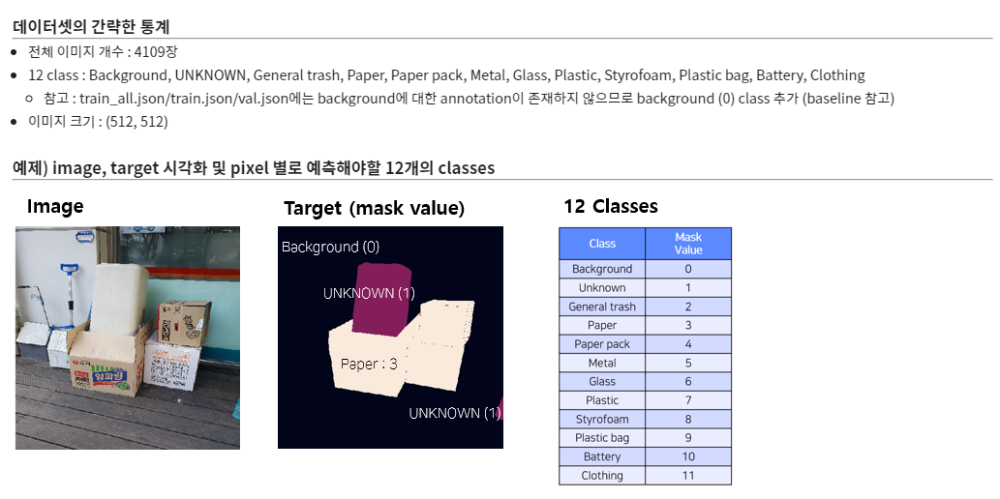

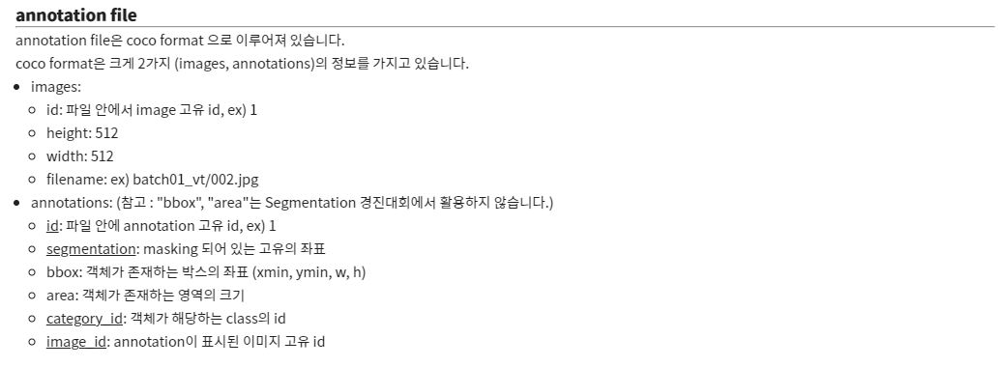

annotation의 image_id: 13, category_id: 7
아래는 image id 13번()의 이미지

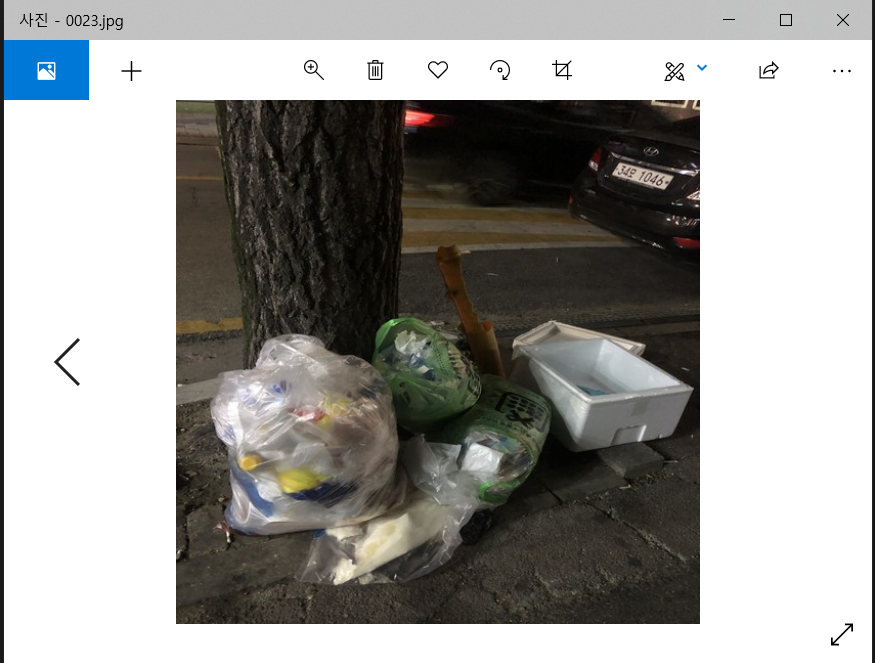

In [15]:
# COCO dataset 이해
train_cat = train_dataset['categories']
train_anns = train_dataset['annotations']
train_imgs = train_dataset['images']

In [16]:
background_list=[]
unknown_list=[]
general_list=[]
paper_list=[]
paper_pack_list=[]
metal_list=[]
glass_list=[]
plastic_list=[]
styrofoam_list=[]
plastic_bag_list=[]
battery_list=[]
clothing_list=[]

# img classficiation == mask number -1
def cat_item(item):
  # if(item["category_id"]==0):
  #   background_list.append(item)
  if(item["category_id"]==0):
    unknown_list.append(item)
  if(item["category_id"]==1):
    general_list.append(item)
  if(item["category_id"]==2):
    paper_list.append(item)
  if(item["category_id"]==3):
    paper_pack_list.append(item)
  if(item["category_id"]==4):
    metal_list.append(item)
  if(item["category_id"]==5):
    glass_list.append(item)
  if(item["category_id"]==6):
    plastic_list.append(item)
  if(item["category_id"]==7):
    styrofoam_list.append(item)
  if(item["category_id"]==8):
    plastic_bag_list.append(item)
  if(item["category_id"]==9):
    battery_list.append(item)
  if(item["category_id"]==10):
    clothing_list.append(item)

for img in train_anns:
  cat_item(img)
  # print(img)

In [17]:
len(train_anns)

21116

In [18]:
len(val_anns)

5284

In [19]:
# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0

for cat_it in train_categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

### Class Imbalance

- class imbalance
- train test class 분포


21116


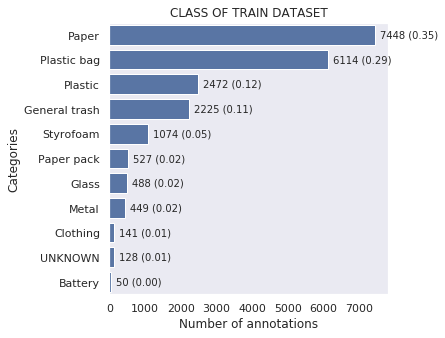

In [20]:
#  class imbalance
import matplotlib.pyplot as plt

# Count annotations
cat_histogram = np.zeros(len(train_categories),dtype=int)
print(len(train_anns))
for ann in train_anns:
    cat_histogram[ann['category_id']] += 1

f, ax = plt.subplots(figsize=(5,5))
# df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
plt.title("CLASS OF TRAIN DATASET")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df, label="Total", color="b")

for idx in plot_1.patches:
  # print(idx)
  plot_1.annotate("%.f (%.2f)" % (idx.get_width(), (idx.get_width()/len(train_anns))) , xy=(idx.get_width(), idx.get_y()+idx.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center")

In [21]:
# val_categories

5284


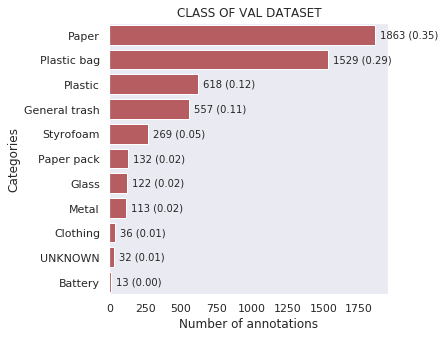

In [22]:
# Count annotations
cat_histogram = np.zeros(len(val_categories),dtype=int)
print(len(val_anns))
for ann in val_anns:
    cat_histogram[ann['category_id']] += 1

f, ax = plt.subplots(figsize=(5,5))
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
plt.title("CLASS OF VAL DATASET")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df, label="Total", color="r")

for idx in plot_1.patches:
  # print(idx)
  plot_1.annotate("%.f (%.2f)" % (idx.get_width(), (idx.get_width()/len(val_anns))) , xy=(idx.get_width(), idx.get_y()+idx.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center")

26400


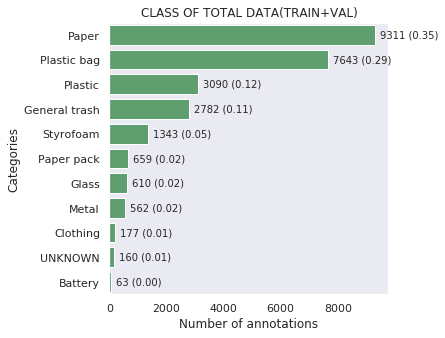

In [23]:
# Count annotations
cat_histogram = np.zeros(len(ta_categories),dtype=int)
print(len(ta_anns))
for ann in ta_anns:
    cat_histogram[ann['category_id']] += 1

f, ax = plt.subplots(figsize=(5,5))
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
plt.title("CLASS OF TOTAL DATA(TRAIN+VAL)")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df, label="Total", color="g")

for idx in plot_1.patches:
  # print(idx)
  plot_1.annotate("%.f (%.2f)" % (idx.get_width(), (idx.get_width()/len(ta_anns))) , xy=(idx.get_width(), idx.get_y()+idx.get_height()/2),

            xytext=(5, 0), textcoords='offset points', ha="left", va="center")

</br></br>

## 모든 데이터(많은 순서대로) 
1.paper
2. plastic bag
3. plastic
4. general trash
5. styrofoam
6. paper pack
7. glass
8. metal
9. clothing
10. unknwon
11. battery

### 추가가 필요한 데이터
Battery: 63개</br>
Unknown: 160개 </br>
Clothing: 177개</br>
metal: 562개</br>
glass: 610개</br>
styrofoam: 1343개</br>

</br></br>


---
</br></br>


### TACO에서 추가할 수 있는 데이터 </br>

### 1.paper
+ papaer </br>

### 2. plastic bag
+ plastic bag </br>

### 3. plastic
+ other plastic  </br>
+ plastic container </br>
+ Plastic glooves </br>
+ Plastic bottle

### 4. general trash

### 5. styrofoam
+ Styrofoam piece

### 6. paper pack
+ 	Plastic bag + wrapper</br>

### 7. glass
+ glass jar  </br>
+ broken glass </br>
+ Glass bottle

### 8. metal
+ can ->metal  </br>
+ aluminium ->metal  </br>
+ scrap metal </br>
+ Aluminium foil

### 9. clothing
+ Shoe </br>

### 10. unknwon

### 11. battery
+ battery  </br>

**	Background
Background도 학습가능

### Class 별 데이터 살펴보기

* 데이터 목록

background_list </br>
unknown_list </br>
general_list </br>
paper 종이: 종이컵, 홀더, 우유팩 </br>
paper_pack 종이봉투 </br>
metal_list 금속 </br>
glass_list 유리 </br>
plastic_list </br>
styrofoam_list </br>
plastic_bag_list 비닐봉투 </br>
battery_list </br>
clothing_list </br>

<Figure size 432x288 with 0 Axes>

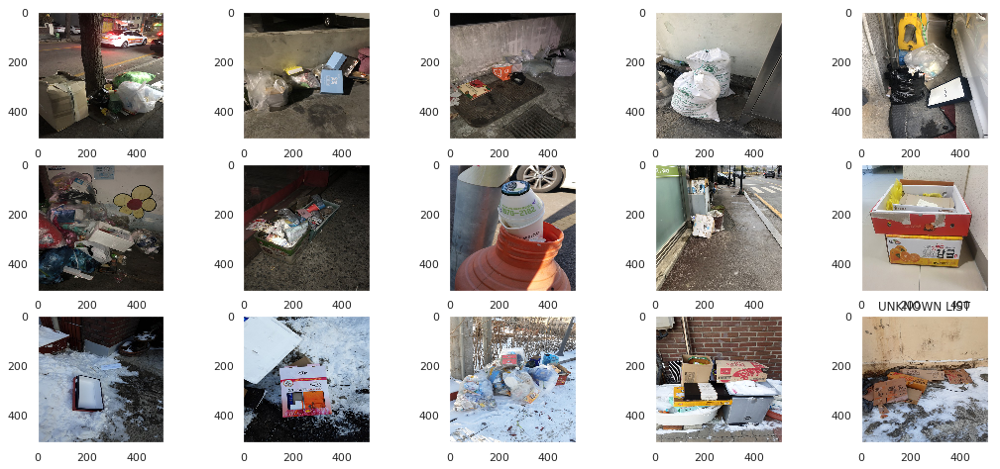

In [24]:
# UNKNOWN LIST

import matplotlib.image as img 
from random import shuffle

# 처음 10개
def show_first_10(list_name):
  list_name_=[]
  plt_list=[]

  plt.figure()

  for item in list_name:
    list_name_.append(item)
  for item in train_imgs:
    for list_item in list_name_:
      if(list_item['image_id']==item['id']):
        if(len(plt_list) and plt_list[-1]["file_name"]==item['file_name']):
          continue
        plt_list.append({"file_name":item['file_name']})
  
  fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(18,8))
  for row in range(3):
    for col in range(5):
      idx = row*5+col
      img_path = "./" + plt_list[idx]["file_name"]
      image = img.imread(img_path)
      ax[row][col].imshow(image)
      # ax1.grid(False)
      # ax1.set_title("title")  
  plt.title("UNKNOWN LIST")
  plt.show()
  
shuffle(unknown_list)
show_first_10(unknown_list[:202])

<Figure size 432x288 with 0 Axes>

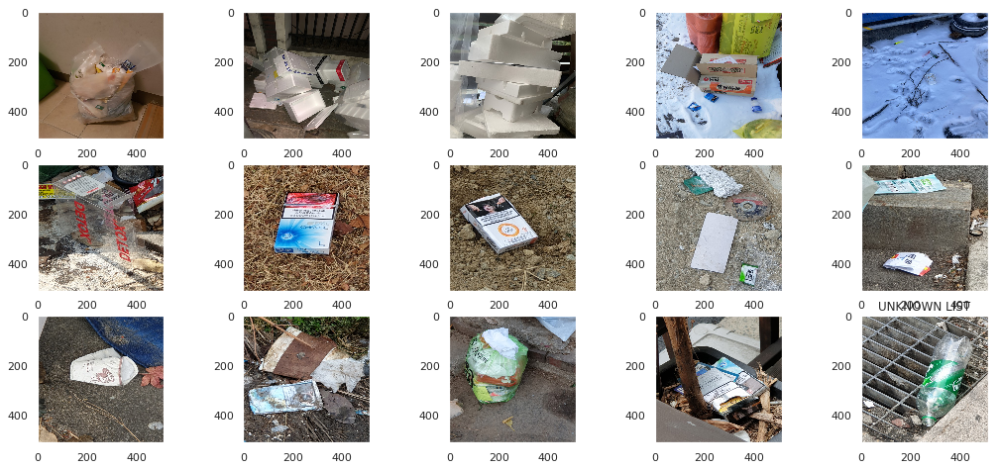

In [25]:
# GENERAL LIST

  
shuffle(general_list)
show_first_10(general_list[:202])

<Figure size 432x288 with 0 Axes>

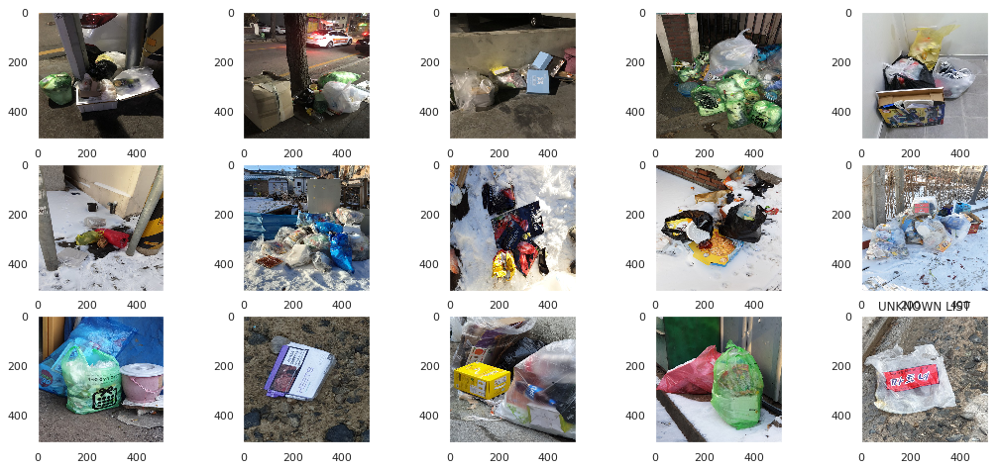

In [26]:
# plastic_bag_list

  
shuffle(plastic_bag_list)
show_first_10(plastic_bag_list[:202])

<Figure size 432x288 with 0 Axes>

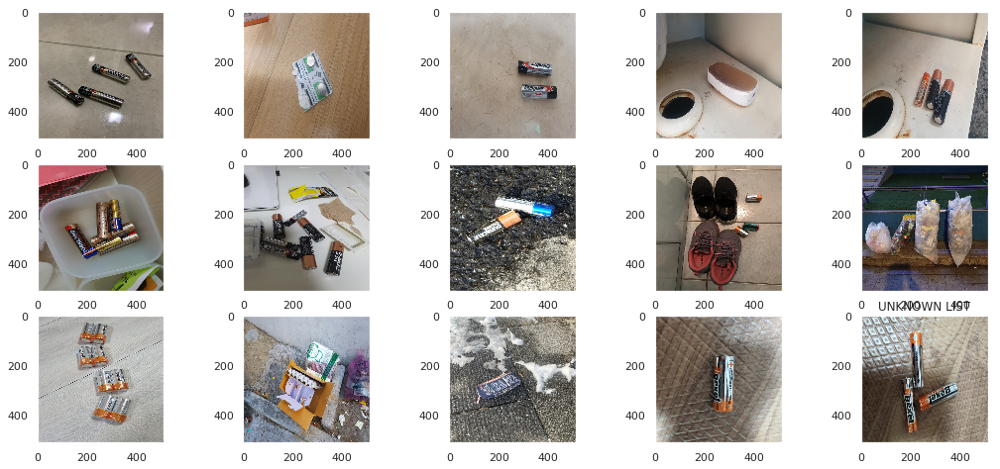

In [27]:
#battery_list
#  실내 background인 경우가 많음
  
shuffle(battery_list)
show_first_10(battery_list[:202])

<Figure size 432x288 with 0 Axes>

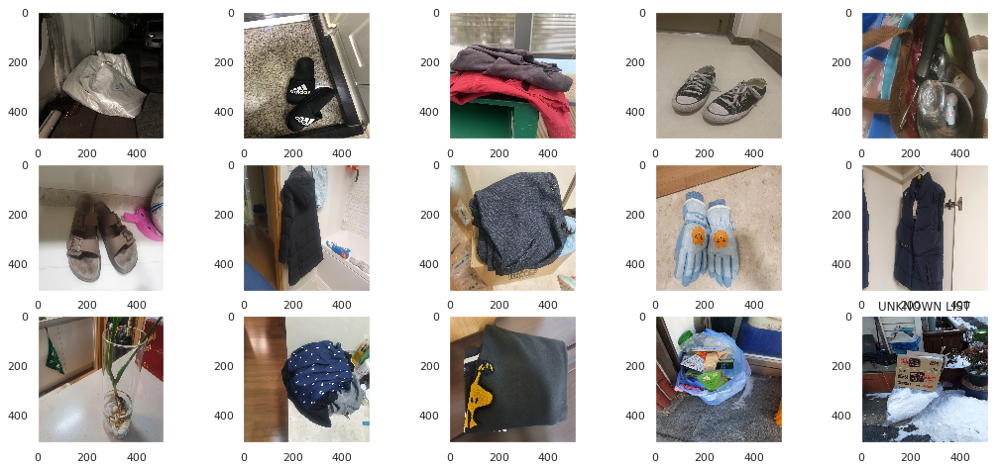

In [28]:
# clothing_list
#  실내 background인 경우가 많음

shuffle(clothing_list)
show_first_10(clothing_list[:202])

<Figure size 432x288 with 0 Axes>

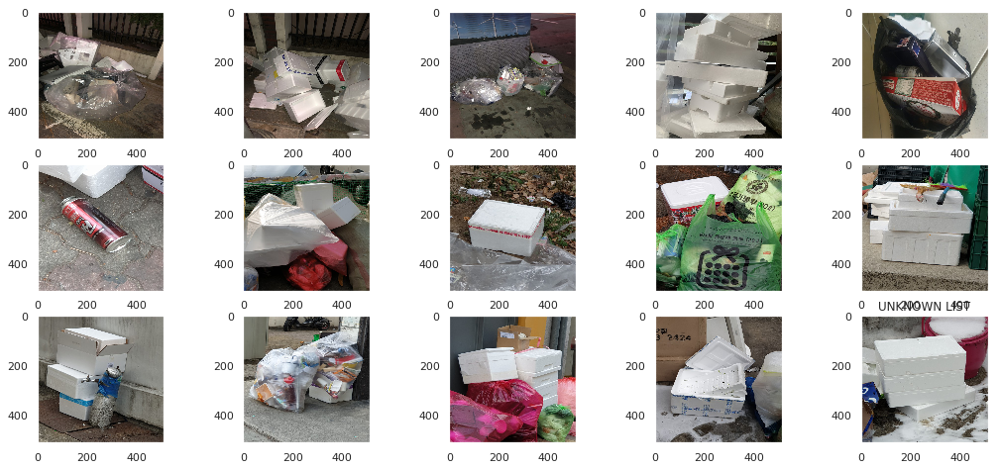

In [29]:
# styrofoam_list

  
shuffle(styrofoam_list)
show_first_10(styrofoam_list[:202])



## (1) Unknown list VS General list

Unknow data는 굉장히 적지만 general trash는 상위 4등의 데이터
Unknown 과 general trash를 구분하는 것이 가능한가?...
다른 쓰레기들과 general trash를 얼마나 잘 구분해내는가?
그냥 둘 다 여러 쓰레기들이 섞여있는 경우...

* classification을 하되 차이가 크지 않는 경우 general로 분리하는 방법?...
* mask 데이터가 3 이상? 4 이상인 경우 general로 분리


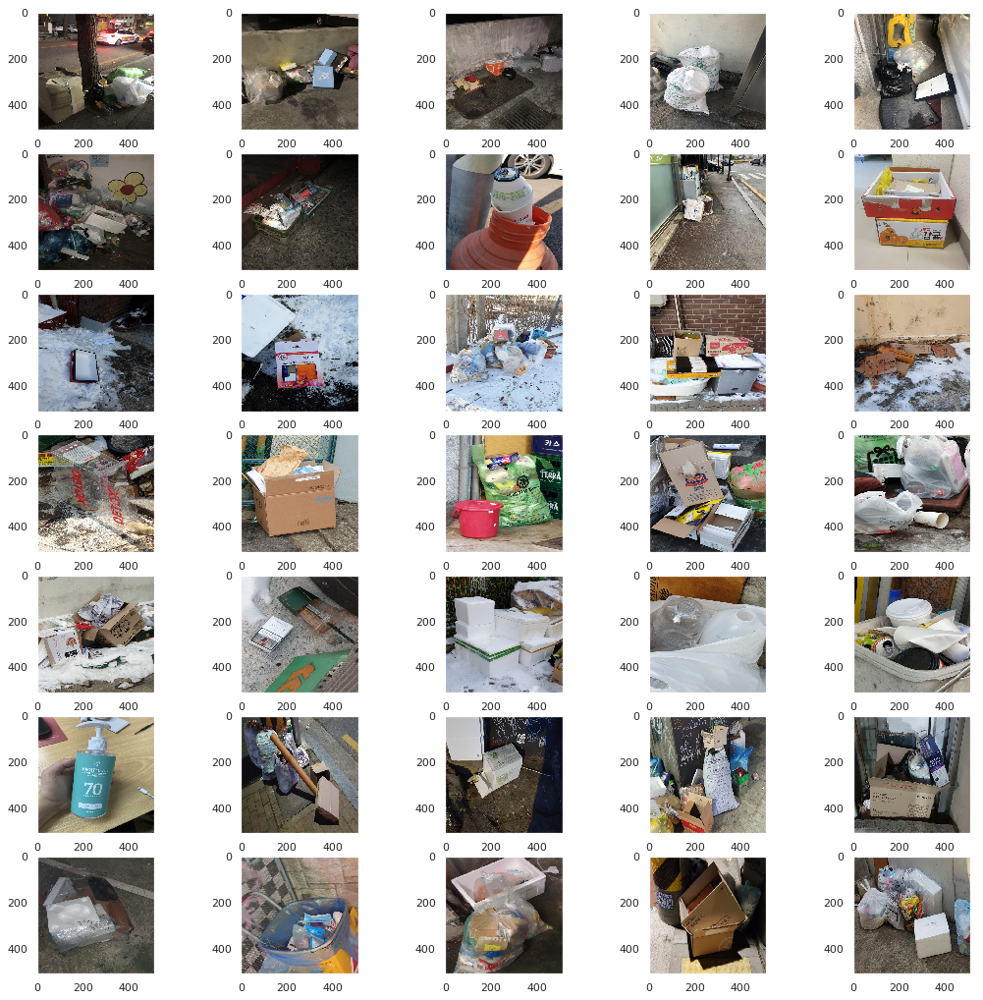

In [30]:
# clothing_list

import matplotlib.image as img 
from random import shuffle

# 처음 10개
def show_first_10(list_name):
  list_name_=[]
  plt_list=[]
  # plt.figure()
  for item in list_name:
    list_name_.append(item)
  for item in train_imgs:
    for list_item in list_name_:
      if(list_item['image_id']==item['id']):
        if(len(plt_list) and plt_list[-1]["file_name"]==item['file_name']):
          continue
        plt_list.append({"file_name":item['file_name']})
  
  fig, ax = plt.subplots(nrows=7, ncols=5,figsize=(18,18))
  for row in range(7):
    for col in range(5):
      idx = row*5+col
      img_path = "./" + plt_list[idx]["file_name"]
      image = img.imread(img_path)
      ax[row][col].imshow(image)
      # ax1.grid(False)
      # ax1.set_title("title")  
  plt.show()
  
shuffle(unknown_list)
show_first_10(unknown_list[:202])

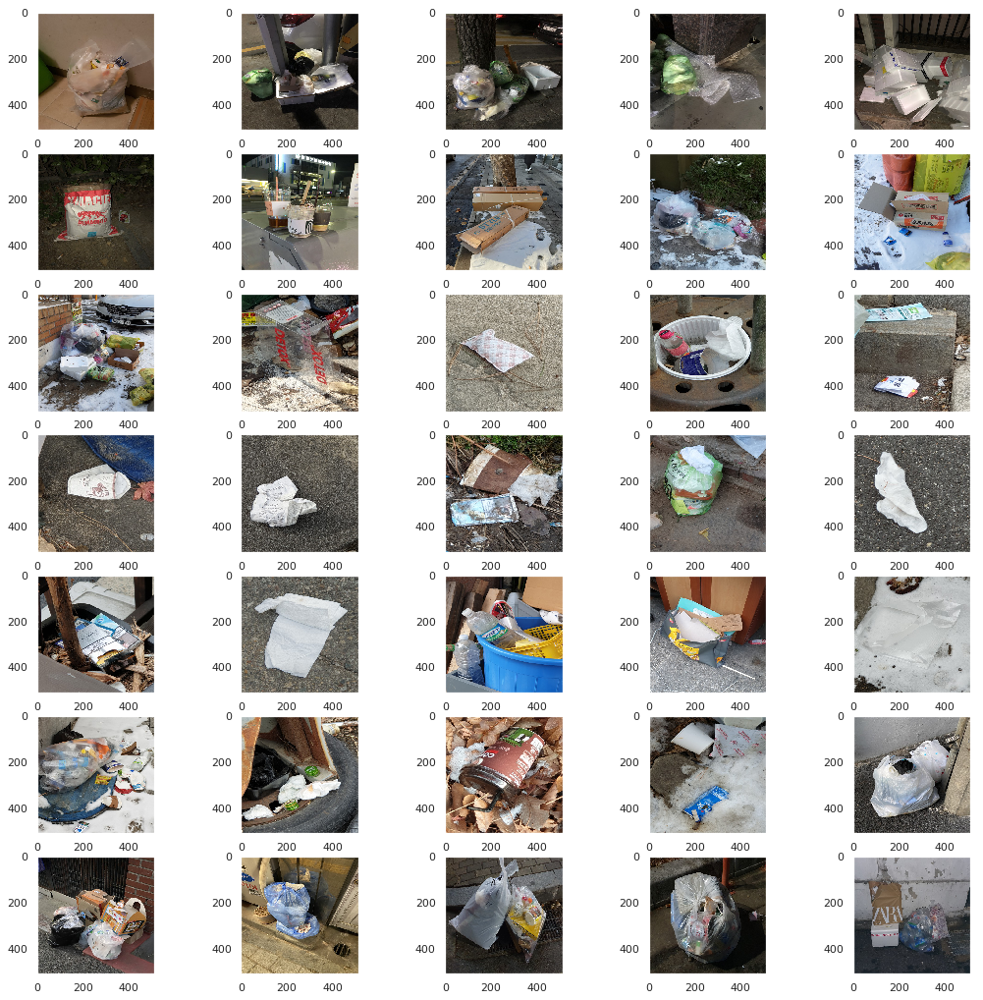

In [31]:
shuffle(general_list)
show_first_10(general_list[:202])

## (2) paper bag VS paper
paper 은 종이가방, 종이박스 생각
paper pack 는 종이컵, 홀더

재질은 비슷하지만 모양이 전혀 다른 경우 -> gated scnn으로 돌리면 효과? (texture 보다 image shape을 더 강조한 모델) </br>
VGG 기준 8s 가 32s보다 분류효과가 좋을 것으로 예상

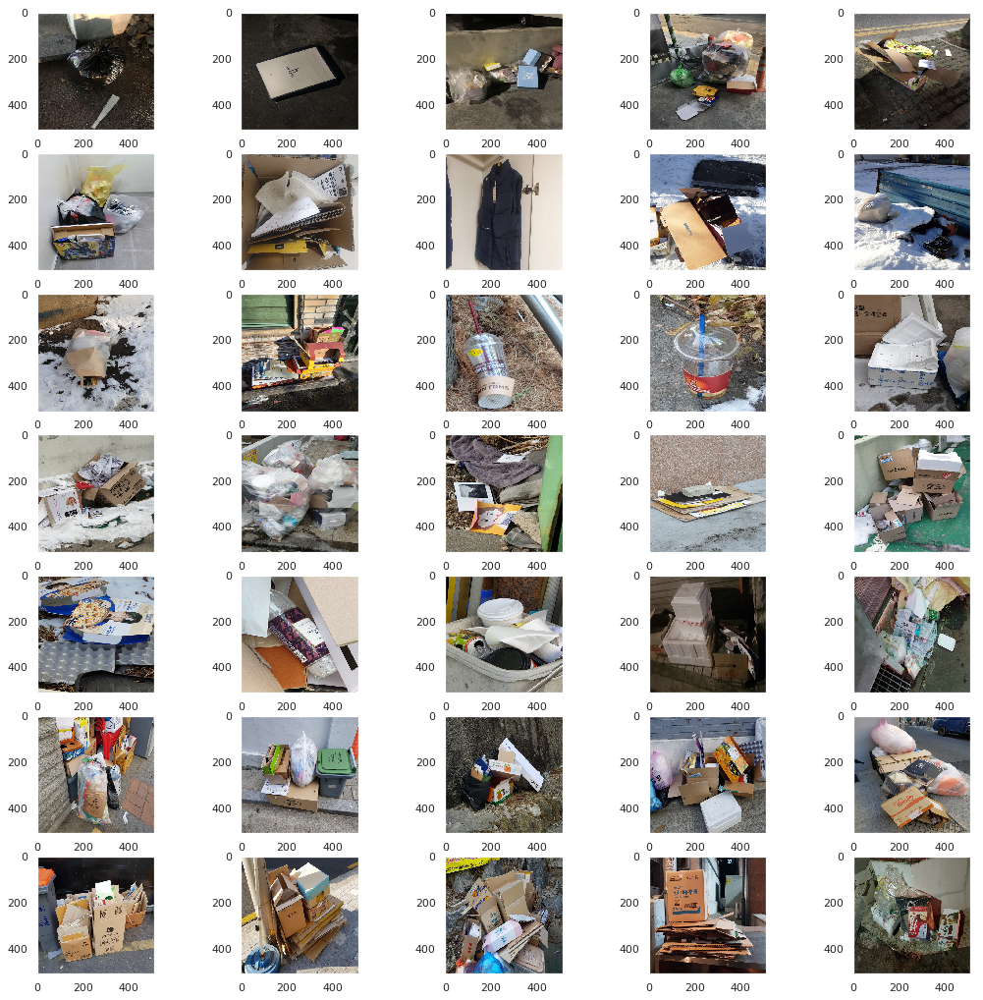

In [32]:
# clothing_list

shuffle(paper_list)
show_first_10(paper_list[:202])

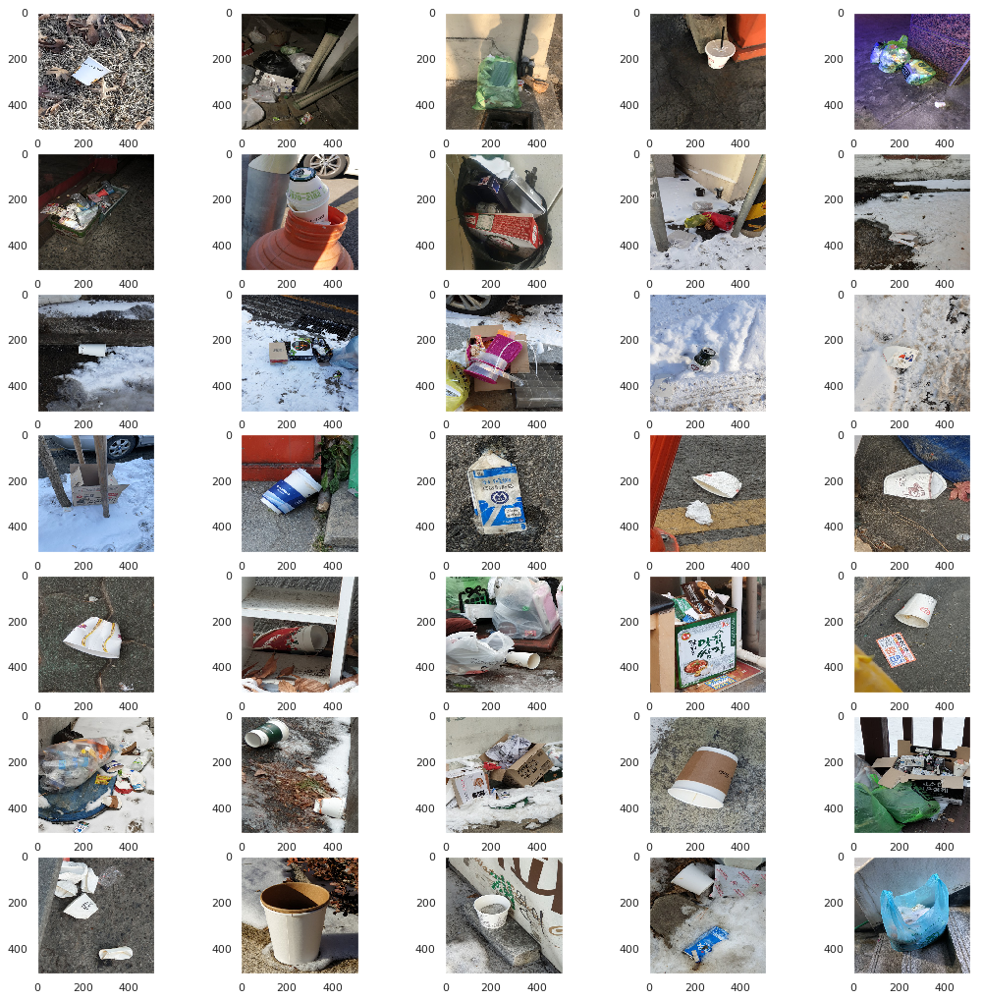

In [33]:
shuffle(paper_pack_list)
show_first_10(paper_pack_list[:202])

## (3) plastic bag VS plastic
plastic bag: 쓰레기 봉투 </br>
plastic: 그외 플라스틱?! </br>

plastic
-> metal, glass의 뚜껑을 분류하기 위해서 lid data를 넣어보는 방법 plastic += plastic_lid </br>

plastic bag 인 경우가 plastic인 경우의 2배이상.. 비슷한 수치가 나오는 경우 plastic을 선택하는 경우를 비례로?


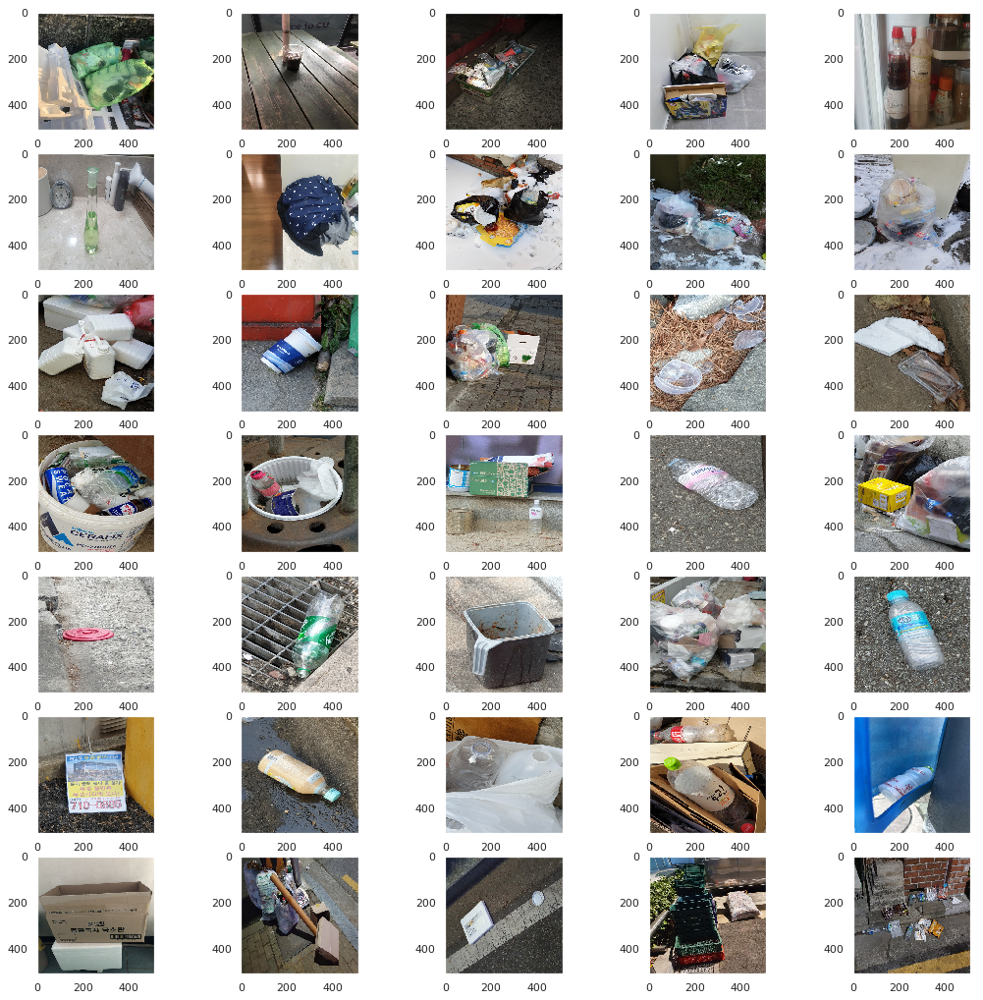

In [34]:
# clothing_list

shuffle(plastic_list)
show_first_10(plastic_list[:202])

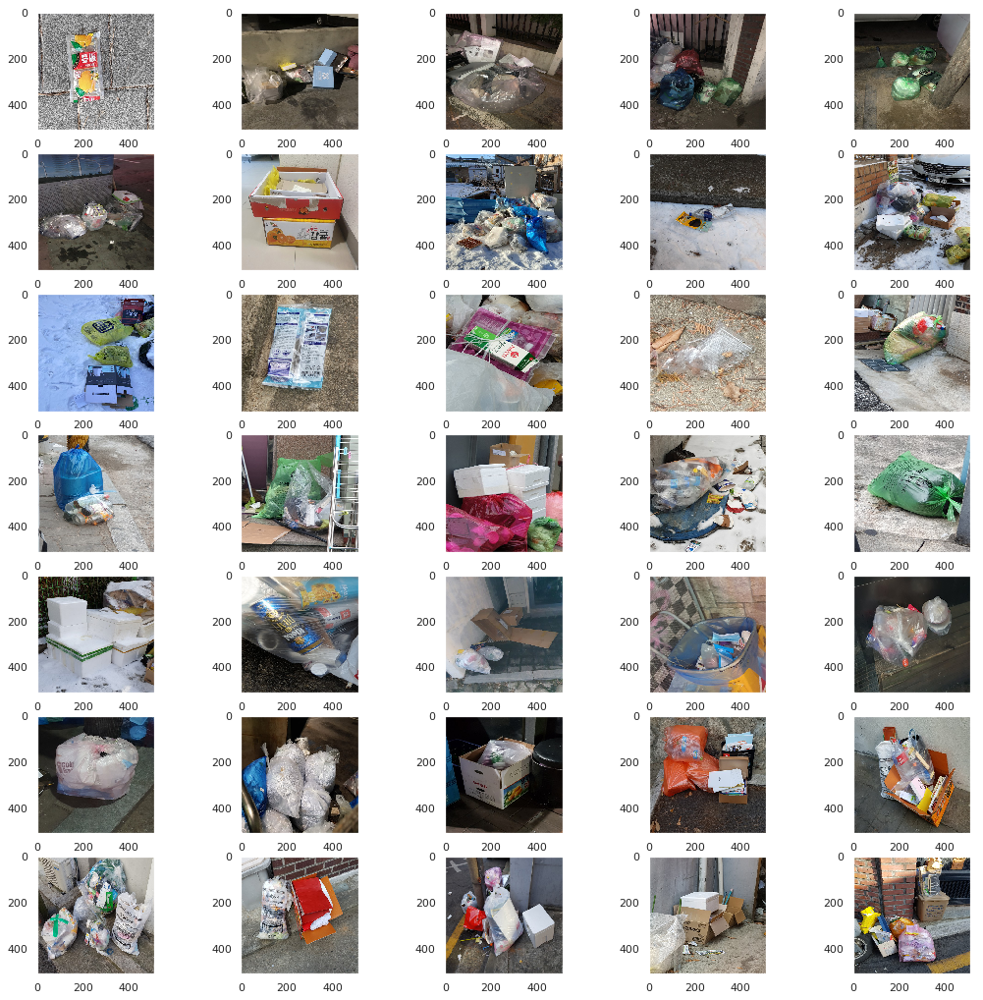

In [35]:
# plastic_bag_list
shuffle(plastic_bag_list)
show_first_10(plastic_bag_list[:202])